Found 784 images belonging to 11 classes.
Found 196 images belonging to 11 classes.


c:\Users\Isabe\anaconda3\envs\fenotipado-cnn\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Isabe\anaconda3\envs\fenotipado-cnn\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.0805 - loss: 2.8169 - val_accuracy: 0.1735 - val_loss: 2.2690
Epoch 2/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 51s 1s/step - accuracy: 0.2210 - loss: 2.2342 - val_accuracy: 0.3469 - val_loss: 2.0035
Epoch 3/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.3074 - loss: 1.9924 - val_accuracy: 0.4439 - val_loss: 1.5564
Epoch 4/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.4128 - loss: 1.6030 - val_accuracy: 0.5357 - val_loss: 1.3642
Epoch 5/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.5073 - loss: 1.3823 - val_accuracy: 0.5204 - val_loss: 1.3425
Epoch 6/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.5666 - loss: 1.2167 - val_accuracy: 0.6633 - val_loss: 0.9813
Epoch 7/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.6327 - loss: 1.0289 - val_accuracy: 0.6633 - val_loss: 1.0207
Epoch 8/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.6591 - loss: 0.9533 - val_accuracy: 0.6888 - val_loss:

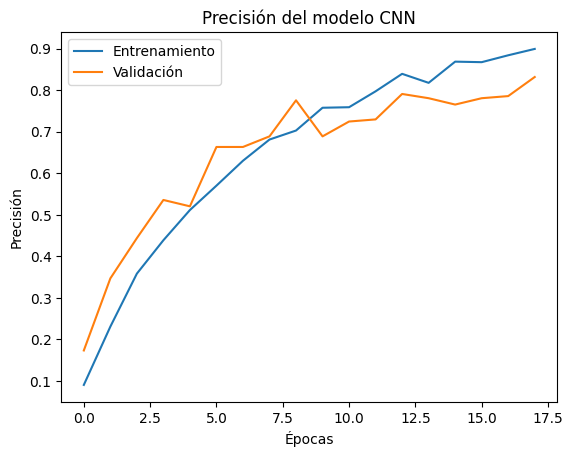

In [ ]:
# 📘 MODELO CNN PARA CLASIFICACIÓN DE HOJAS CÍTRICAS
# Proyecto: Fenotipado vegetal con imágenes
# Autora: Isabella Torres Santamaría
# Fecha: 2025-05-10

# 🧱 1. IMPORTACIÓN DE LIBRERÍAS
# Se importan las librerías necesarias para la construcción del modelo CNN,
# aumento de datos, visualización y entrenamiento con Keras.
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# 📁 2. RUTAS DE DATOS
# Define las rutas de las carpetas que contienen las imágenes divididas en 'train' y 'val'.
directorio_base = "C:/Users/Isabe/OneDrive/Escritorio/Proyecto_Fenotipado/Dataset"
directorio_train = os.path.join(directorio_base, "train")
directorio_val = os.path.join(directorio_base, "val")

# 🔄 3. AUMENTO DE DATOS
# Normaliza los píxeles dividiendo por 255. Aquí no se aplican transformaciones extra (solo reescalado),
# porque las imágenes ya están balanceadas y limpias.
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

# Carga las imágenes en lotes desde las carpetas organizadas por clase
train_generator = train_datagen.flow_from_directory(
    directorio_train,
    target_size=(128, 128),  # Redimensiona imágenes para que todas tengan el mismo tamaño
    batch_size=16,
    class_mode='categorical'  # Clasificación multiclase (una clase por hoja)
)

val_generator = val_datagen.flow_from_directory(
    directorio_val,
    target_size=(128, 128),
    batch_size=16,
    class_mode='categorical'
)

# 🧠 4. ARQUITECTURA DEL MODELO
# Se construye una red CNN simple pero efectiva para imágenes pequeñas:
# Dos bloques Conv2D + MaxPooling, luego capa densa con Dropout, y salida softmax para clasificación multiclase.
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_generator.num_classes, activation='softmax')  # Output según número de clases
])

# Compila el modelo con el optimizador Adam y función de pérdida para clasificación multiclase
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# 🚀 5. ENTRENAMIENTO DEL MODELO
# Se entrena el modelo con EarlyStopping (detiene el entrenamiento si no mejora en 5 épocas seguidas).
es = EarlyStopping(patience=5, restore_best_weights=True)

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=30,
    callbacks=[es]
)

# 💾 Guarda el modelo entrenado en un archivo .h5 para su uso posterior.
model.save("C:/Users/Isabe/OneDrive/Escritorio/Proyecto_Fenotipado/modelo_cnn_hojas_citricas.h5")

# 📊 6. EVALUACIÓN VISUAL
# Grafica la precisión (accuracy) en entrenamiento y validación por época
# para observar el comportamiento y posible sobreajuste del modelo.
plt.plot(history.history['accuracy'], label='Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Validación')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.title('Precisión del modelo CNN')
plt.legend()
plt.show()



In [2]:
# 💾 Guardar el modelo entrenado
modelo_path = "C:/Users/Isabe/OneDrive/Escritorio/Proyecto_Fenotipado/modelo_cnn_hojas_citricas.h5"
model.save(modelo_path)
print(f"✅ Modelo guardado exitosamente en: {modelo_path}")


✅ Modelo guardado exitosamente en: C:/Users/Isabe/OneDrive/Escritorio/Proyecto_Fenotipado/modelo_cnn_hojas_citricas.h5


Found 196 images belonging to 11 classes.


196/196 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step


<Figure size 1000x800 with 0 Axes>

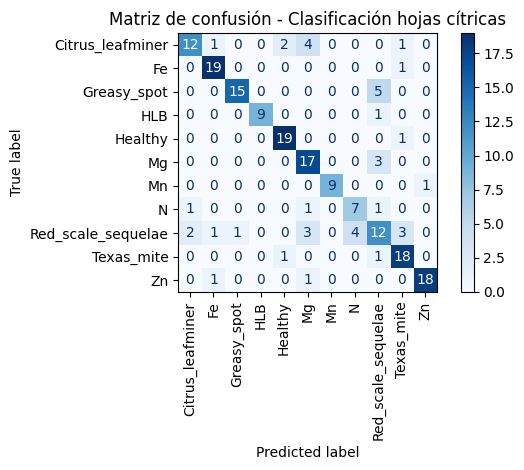

📋 Reporte de clasificación:

                    precision    recall  f1-score   support

  Citrus_leafminer       0.80      0.60      0.69        20
                Fe       0.86      0.95      0.90        20
       Greasy_spot       0.94      0.75      0.83        20
               HLB       1.00      0.90      0.95        10
           Healthy       0.86      0.95      0.90        20
                Mg       0.65      0.85      0.74        20
                Mn       1.00      0.90      0.95        10
                 N       0.64      0.70      0.67        10
Red_scale_sequelae       0.52      0.46      0.49        26
        Texas_mite       0.75      0.90      0.82        20
                Zn       0.95      0.90      0.92        20

          accuracy                           0.79       196
         macro avg       0.82      0.81      0.81       196
      weighted avg       0.80      0.79      0.79       196



In [ ]:
# 📊 MATRIZ DE CONFUSIÓN Y REPORTE DE CLASIFICACIÓN
# Evalúa el rendimiento del modelo CNN con predicciones en el conjunto de validación.
# Muestra matriz de confusión y métricas por clase.

import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model

# 📁 Rutas
# Ruta al conjunto de validación y al modelo previamente entrenado y guardado.
directorio_val = r"C:/Users/Isabe/OneDrive/Escritorio/Proyecto_Fenotipado/Dataset/val"
modelo_path = r"C:/Users/Isabe/OneDrive/Escritorio/Proyecto_Fenotipado/modelo_cnn_hojas_citricas.h5"

# 🔄 Cargar conjunto de validación
# Se crea un generador sin aleatorización (shuffle=False) para asegurar orden correcto de etiquetas.
val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_directory(
    directorio_val,
    target_size=(128, 128),
    batch_size=1,  # Batch pequeño para obtener predicción imagen por imagen
    class_mode='categorical',
    shuffle=False
)

# 🧠 Cargar modelo
# Se carga el modelo previamente entrenado (.h5) para evaluar sobre el conjunto de validación.
modelo = load_model(modelo_path)

# 🔍 Hacer predicciones
# Se predice clase para cada imagen del conjunto de validación.
predicciones = modelo.predict(val_generator)
pred_clases = np.argmax(predicciones, axis=1)  # Se obtiene la clase con mayor probabilidad
verdaderas_clases = val_generator.classes       # Clases reales
nombres_clases = list(val_generator.class_indices.keys())  # Nombres de las clases

# 📊 Mostrar matriz de confusión
# Se genera y muestra la matriz de confusión entre clases reales y predichas.
cm = confusion_matrix(verdaderas_clases, pred_clases)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=nombres_clases)
plt.figure(figsize=(10, 8))
disp.plot(xticks_rotation=90, cmap='Blues')
plt.title("Matriz de confusión - Clasificación hojas cítricas")
plt.tight_layout()
plt.show()

# 📋 Reporte de clasificación
# Imprime métricas por clase: precisión, recall, F1-score y soporte.
reporte = classification_report(verdaderas_clases, pred_clases, target_names=nombres_clases)
print("📋 Reporte de clasificación:\n")
print(reporte)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


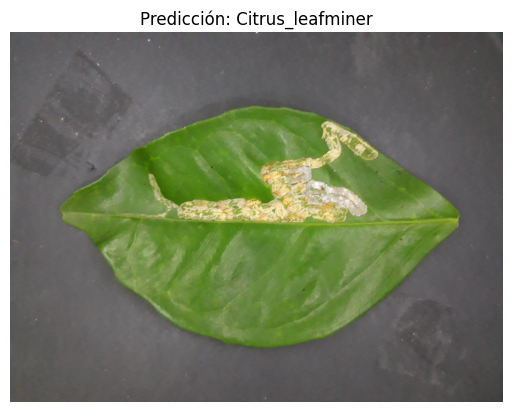

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


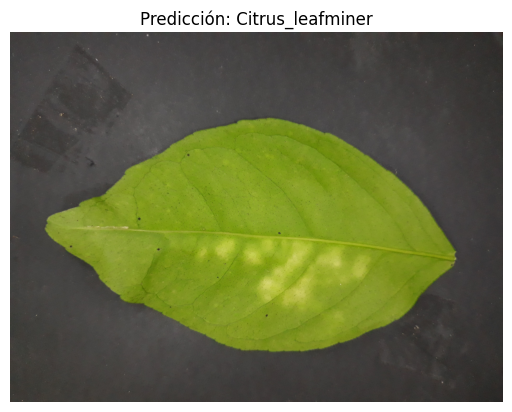

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


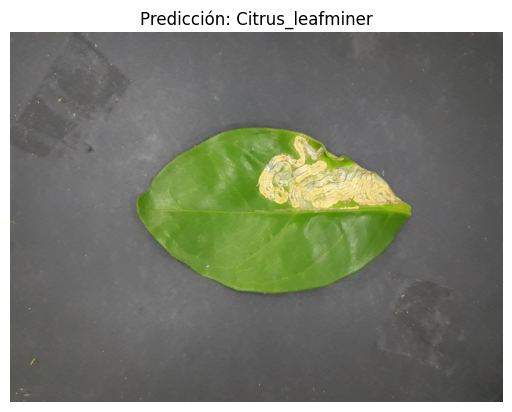

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


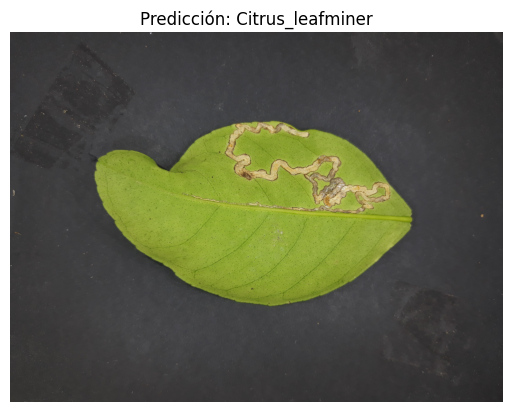

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


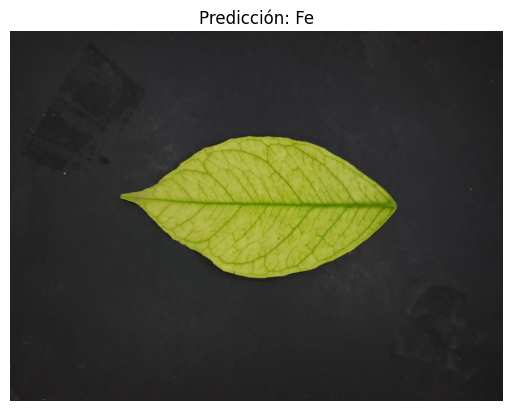

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


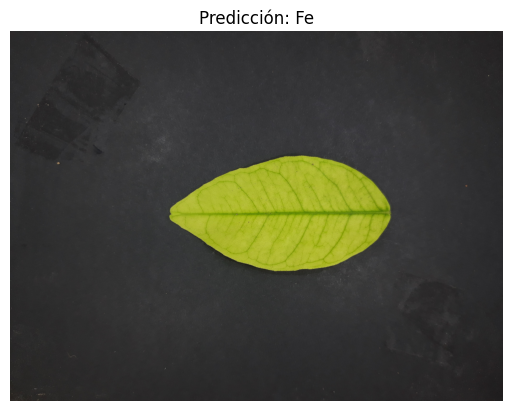

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


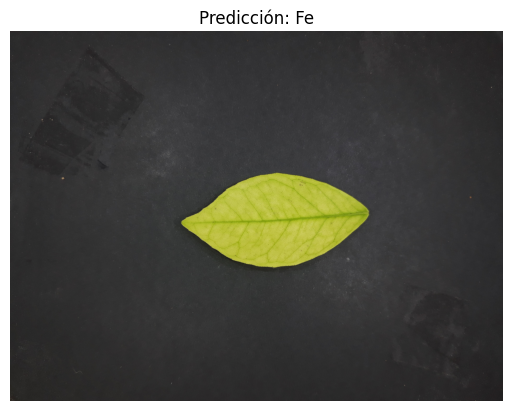

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


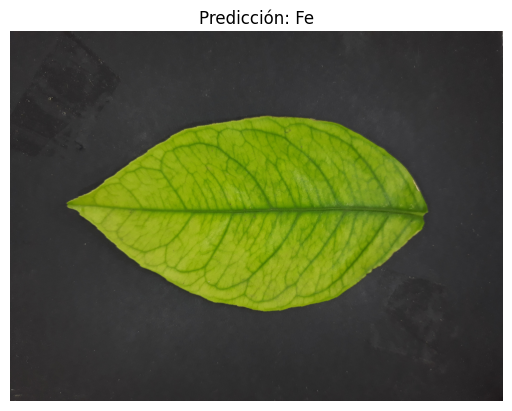

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


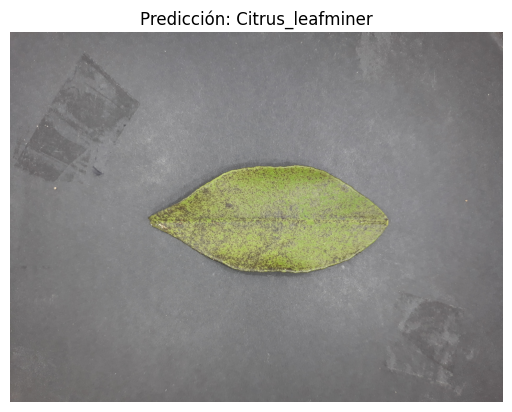

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


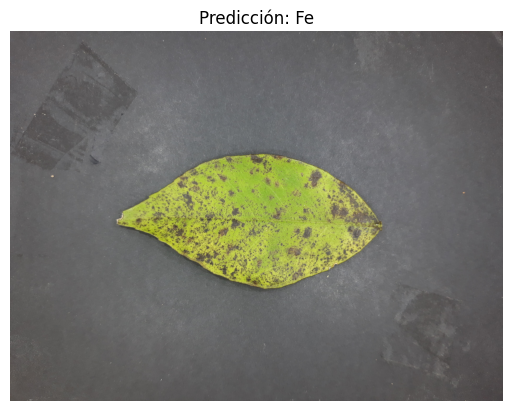

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


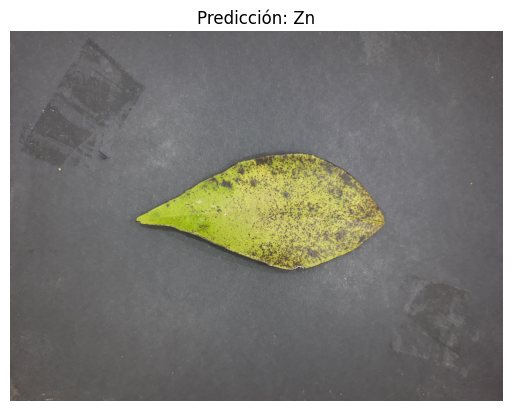

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


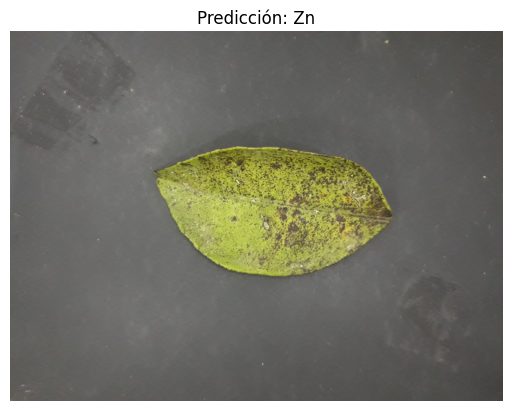

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


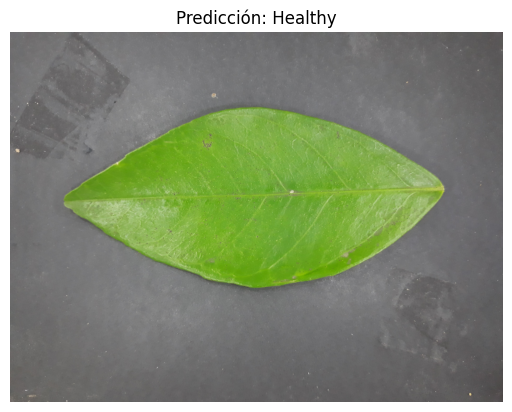

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


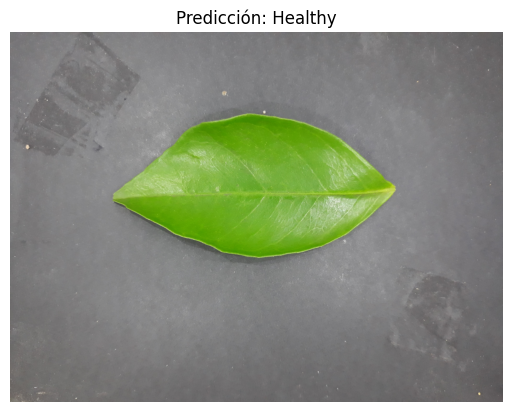

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


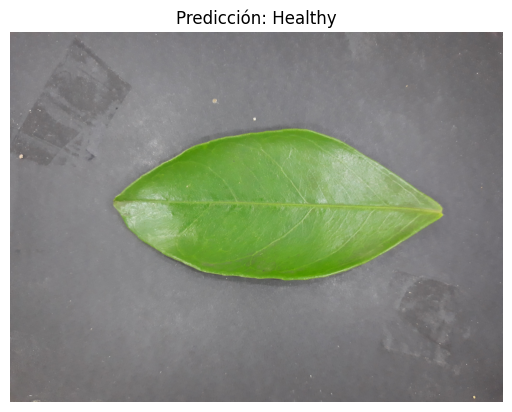

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


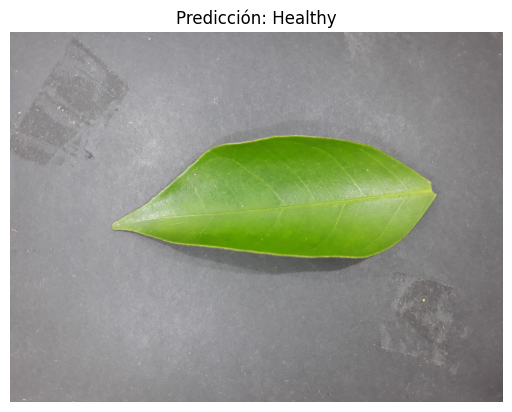

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


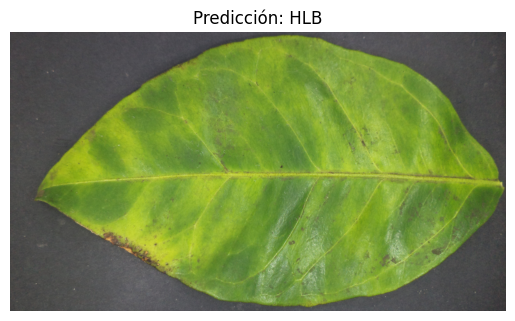

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


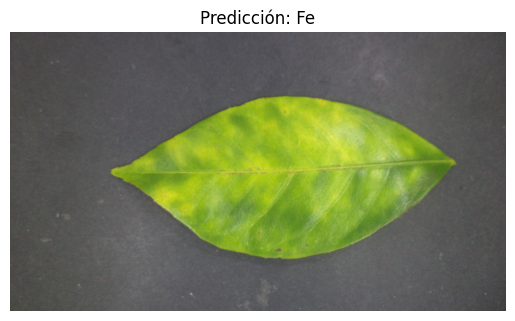

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


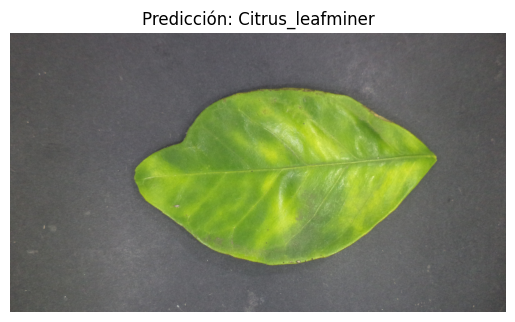

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


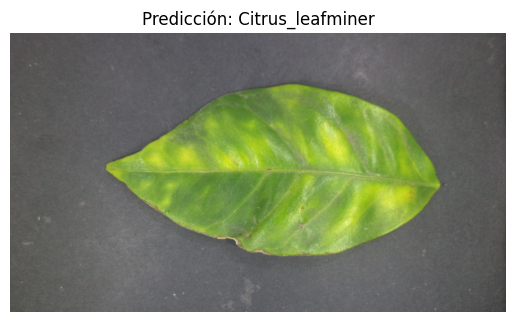

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


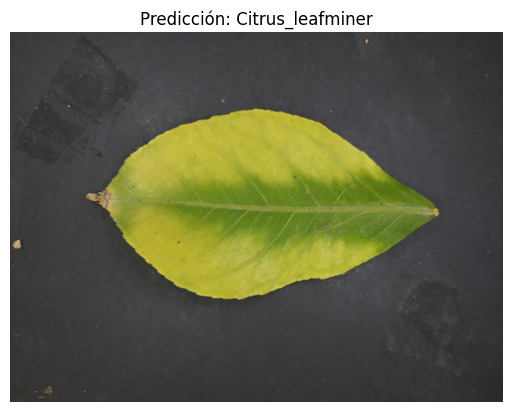

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


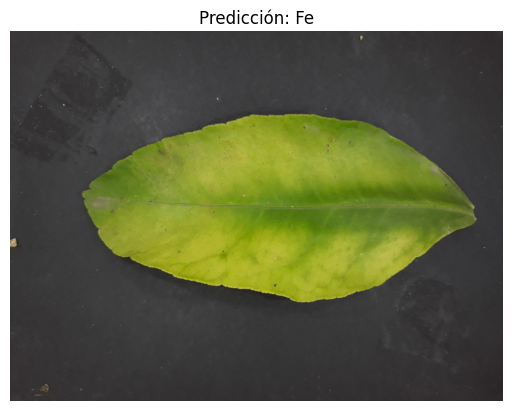

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


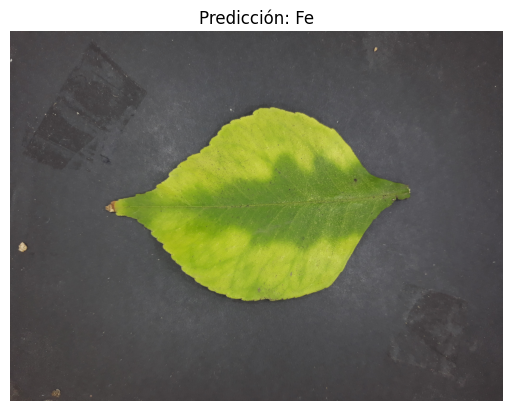

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


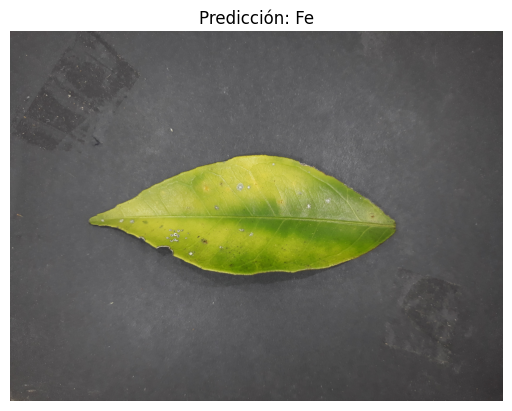

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


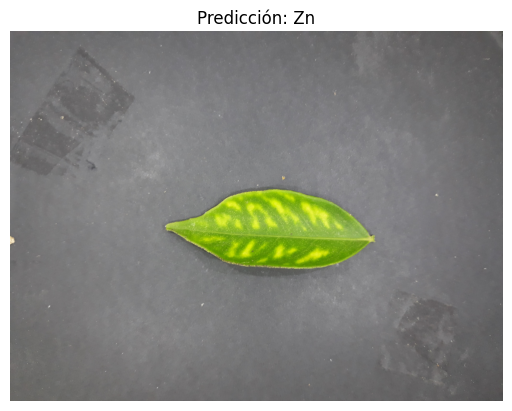

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


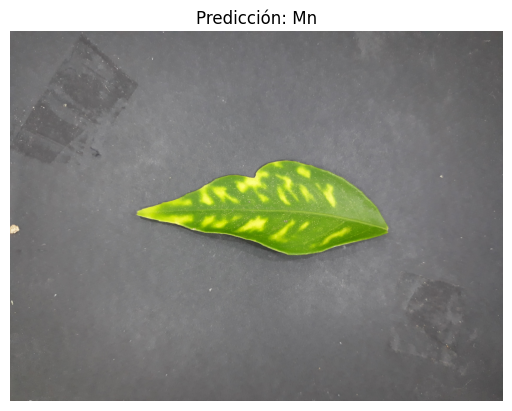

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


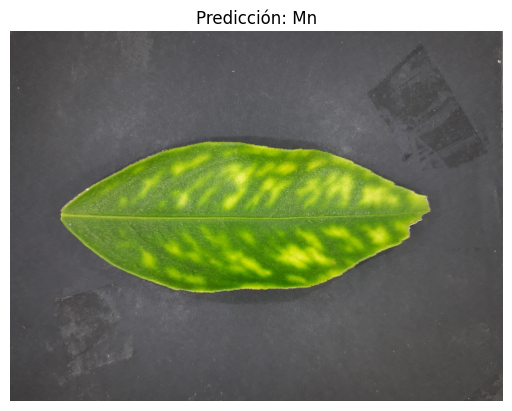

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


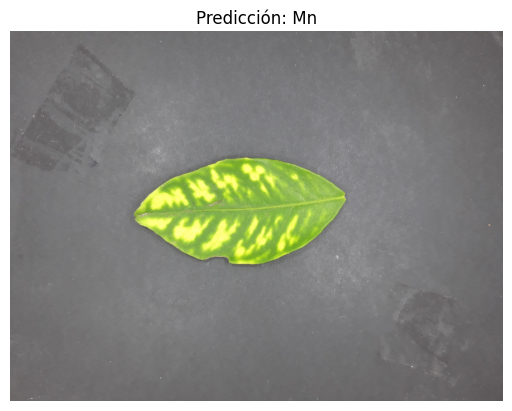

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


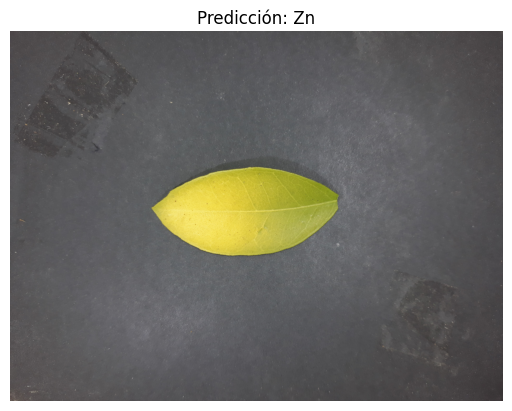

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


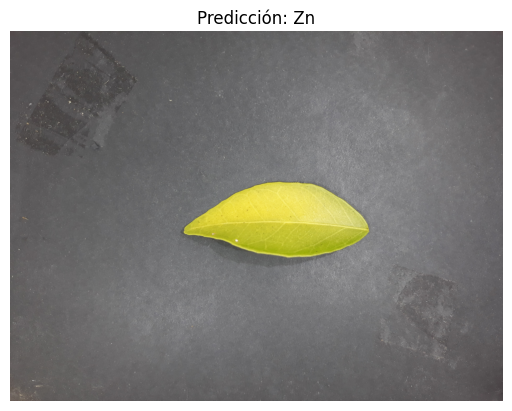

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


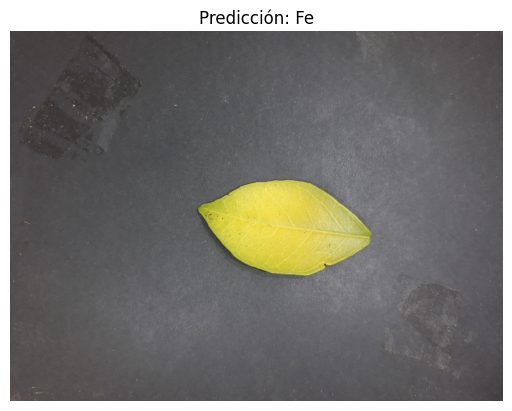

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


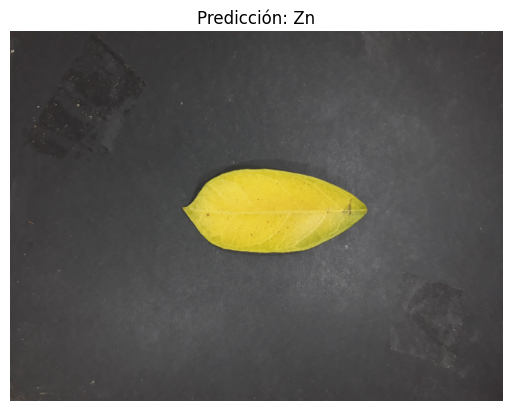

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


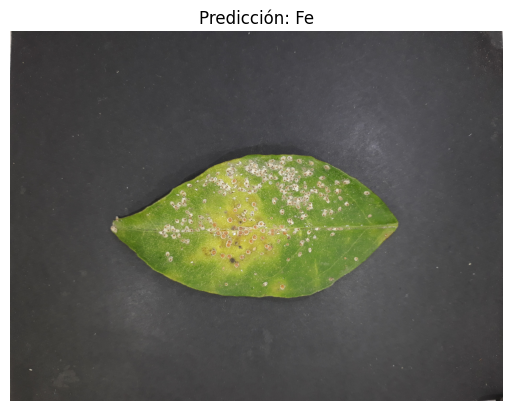

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


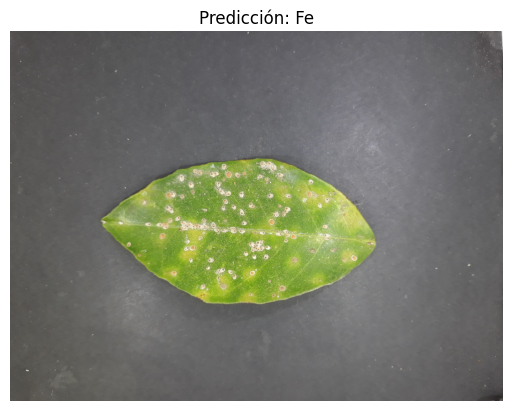

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


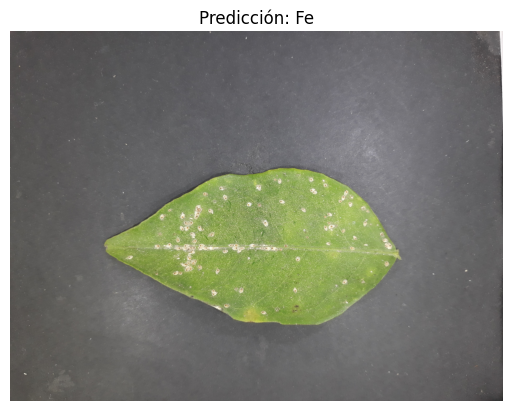

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


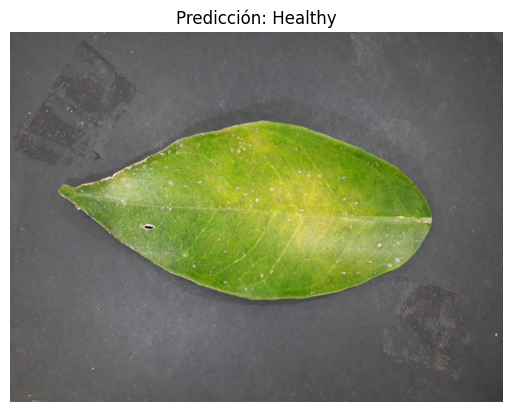

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


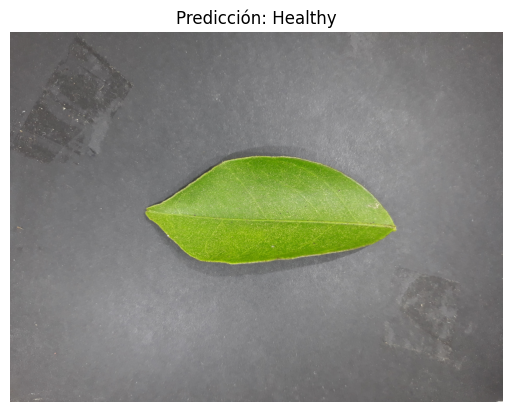

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


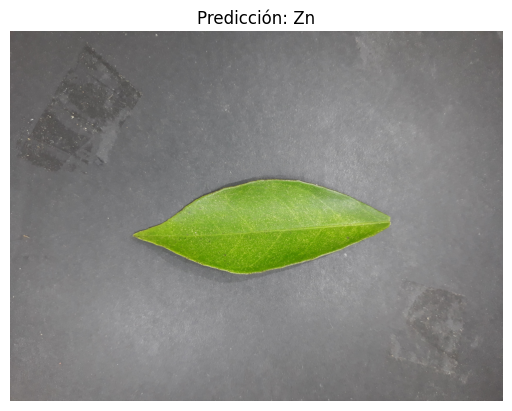

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


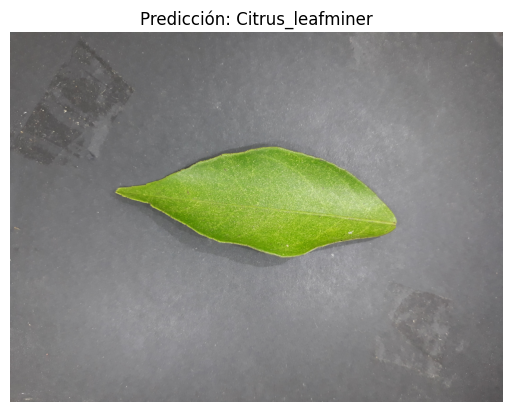

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


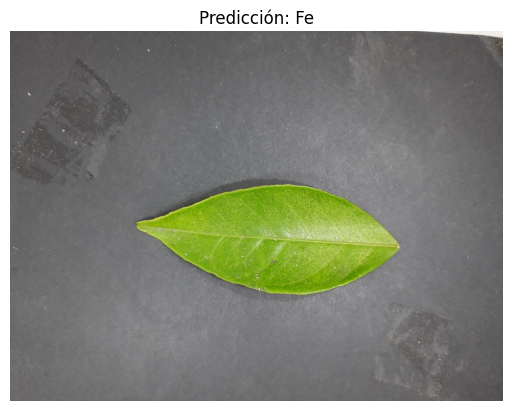

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


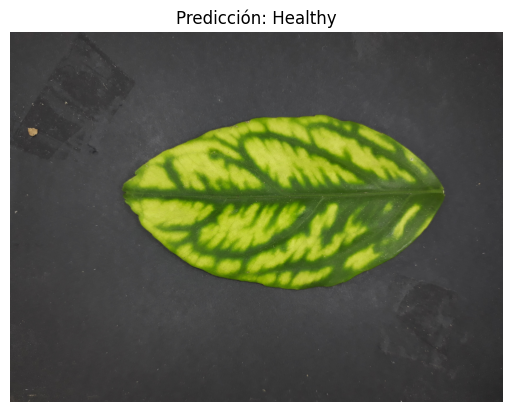

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


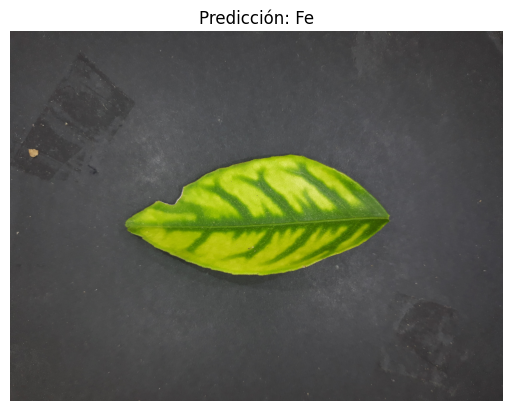

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


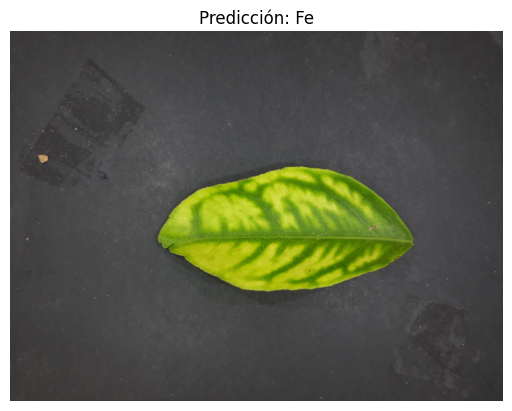

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


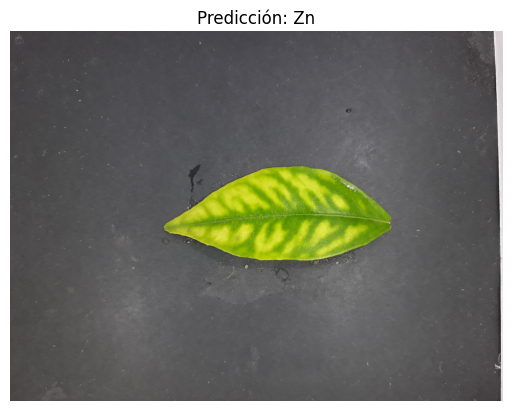

In [ ]:
# 📘 CLASIFICAR TODAS LAS IMÁGENES DE UNA CARPETA USANDO EL MODELO CNN
# Proyecto: Fenotipado vegetal - Clasificación de hojas cítricas
# Autora: Isabella Torres Santamaría
# Fecha: 2025-05-10

# 🧱 1. IMPORTACIÓN DE LIBRERÍAS
# Se importan las librerías necesarias para cargar el modelo, procesar imágenes y visualizar resultados.
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt

# 📁 2. RUTAS DE DATOS
# Ruta al modelo CNN entrenado y a la carpeta con imágenes individuales para prueba.
modelo_path = r"C:/Users/Isabe/OneDrive/Escritorio/Proyecto_Fenotipado/modelo_cnn_hojas_citricas.h5"
carpeta_pruebas = r"C:/Users/Isabe/OneDrive/Escritorio/Proyecto_Fenotipado/Pruebas_individuales"

# Lista con los nombres de las clases, en el mismo orden que fueron usadas en el entrenamiento.
class_names = ['Citrus_leafminer', 'Fe', 'Greasy_spot', 'HLB', 'Healthy', 'Mg', 'Mn', 'N', 'Red_scale_sequelae', 'Texas_mite', 'Zn']

# 🧠 3. CARGAR MODELO
# Se carga el modelo previamente entrenado para hacer predicciones sobre nuevas imágenes.
modelo = load_model(modelo_path)

# 🔍 4. CLASIFICAR TODAS LAS IMÁGENES
# Se recorre cada imagen de la carpeta de pruebas, se procesa y se predice su clase.
imagenes = [f for f in os.listdir(carpeta_pruebas) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

for nombre in imagenes:
    ruta = os.path.join(carpeta_pruebas, nombre)
    img = cv2.imread(ruta)
    if img is None:
        print(f"⚠️ No se pudo leer la imagen: {nombre}")
        continue

    # Preprocesamiento: redimensionar, normalizar, y adaptar forma para el modelo
    img_resized = cv2.resize(img, (128, 128))
    img_normalizada = img_resized.astype("float32") / 255.0
    img_expandida = np.expand_dims(img_normalizada, axis=0)

    # Predicción con el modelo cargado
    pred = modelo.predict(img_expandida)
    clase_predicha = class_names[np.argmax(pred)]  # Se toma la clase con mayor probabilidad

    # 🎨 Mostrar resultado
    # Se muestra la imagen original con el nombre de la clase predicha como título.
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(f"Predicción: {clase_predicha}")
    plt.axis('off')
    plt.show()
